# (25) save corrupted data

**Motivation**: host = ```mach```, device = ```cuda:0``` <br>

In [1]:
# HIDE CODE


import os, sys
from IPython.display import display

# tmp & extras dir
git_dir = os.path.join(os.environ['HOME'], 'Dropbox/git')
extras_dir = os.path.join(git_dir, 'jb-vae/_extras')
fig_base_dir = os.path.join(git_dir, 'jb-vae/figs')
tmp_dir = os.path.join(git_dir, 'jb-vae/tmp')

# GitHub
# sys.path.insert(0, os.path.join(git_dir, '_PoissonVAE'))
sys.path.insert(0, os.path.join(git_dir, '_IterativeVAE'))
from figures.fighelper import *
from vae.train_vae import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=UserWarning)
from rich.jupyter import print
%matplotlib inline
set_style()

In [2]:
from base.utils_model import load_quick
from figures.analysis import plot_convergence
from figures.imgs import plot_weights

device_idx = 0
device = f'cuda:{device_idx}'

print(f"device: {device}  ———  host: {os.uname().nodename}")

device: cuda:0  ———  host: mach

In [3]:
from analysis.corrupt import save_corrupted_data

## Save corrupted data

In [4]:
save_dir = pjoin(tmp_dir, 'corrupted_data')
corruption_params = save_corrupted_data(
    save_dir, device)

print(corruption_params)

100%|████████████████████████████████████████████| 3/3 [06:58<00:00, 139.38s/it]


{
    'noise': ('sigma', [0.3, 0.6, 0.9, 1.2, 1.5, 1.8, 2.1]),
    'blur': ('sigma', [0.5, 1.0, 1.5, 2.0, 2.5, 3.0]),
    'speckle': ('std', [1.0, 2.0, 3.0, 4.0]),
    'salt_pepper': ('amount', [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8]),
    'contrast': ('contrast_factor', [0.1, 0.2, 0.3, 0.4, 0.5]),
    'rotate': ('angle', [15, 30, 45, 60, 75, 90, 105, 120, 135, 150, 165, 180])
}

## Plot

In [5]:
load_dir = pjoin(tmp_dir, 'corrupted_data')

files = os.listdir(pjoin(tmp_dir, 'corrupted_data'))
files = sorted(files, key=alphanum_sort_key)
len(files)

126

In [6]:
num = 32
rng = get_rng()

______________________________________________________________________________________________________________

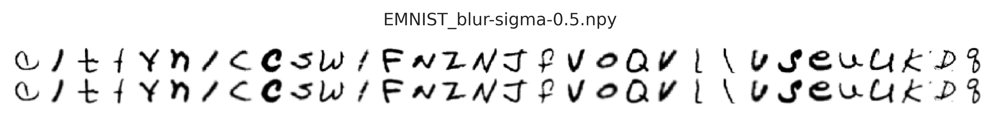

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

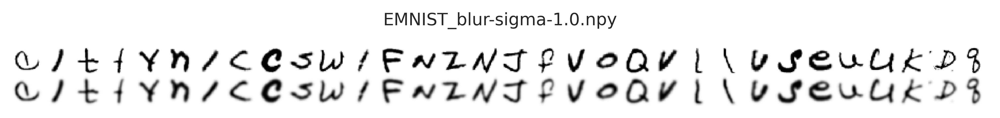

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

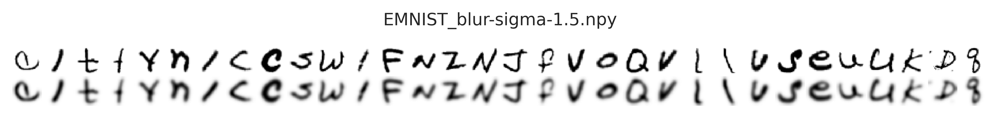

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

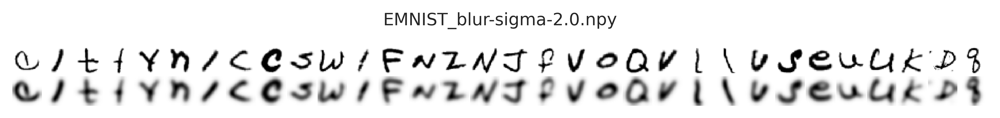

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

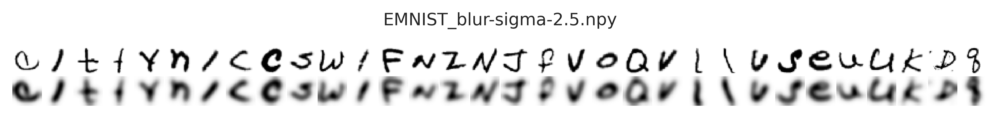

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

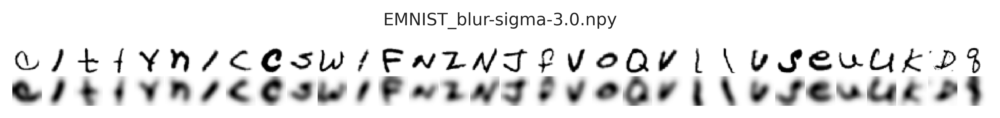

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

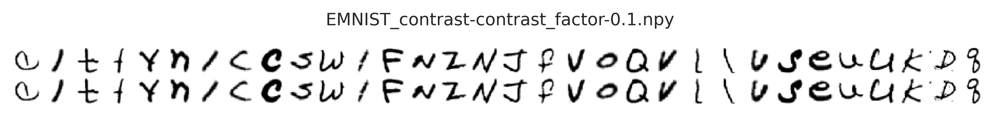

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

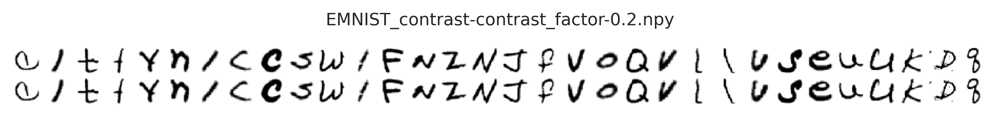

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

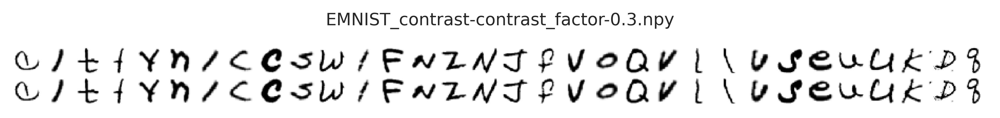

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

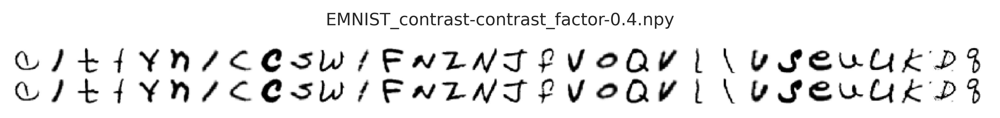

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

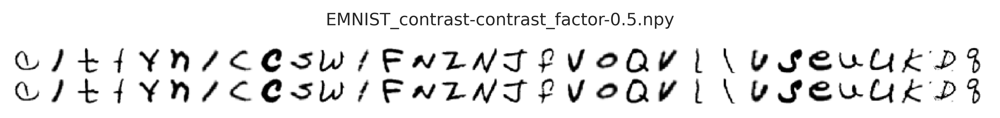

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

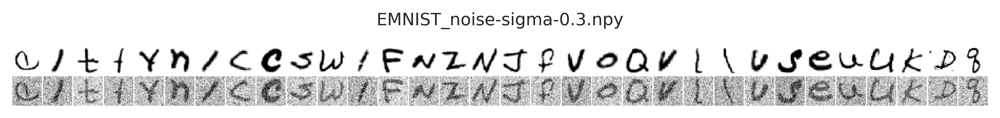

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

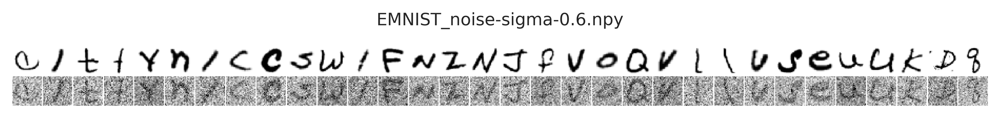

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

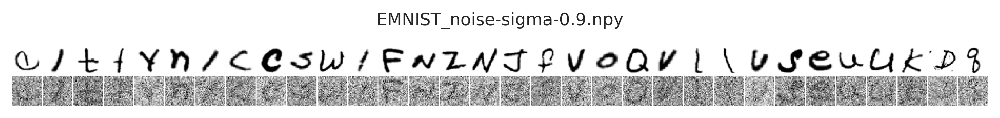

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

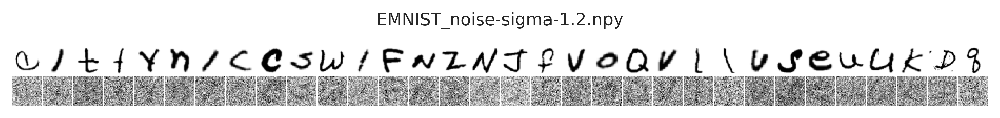

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

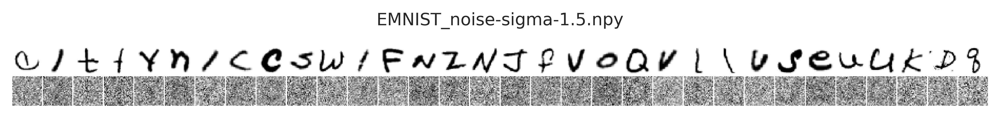

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

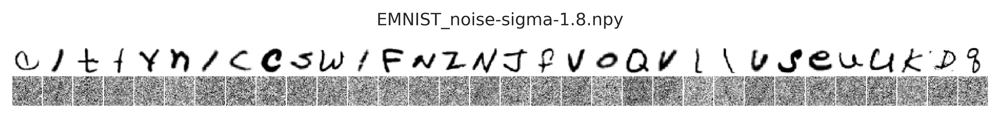

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

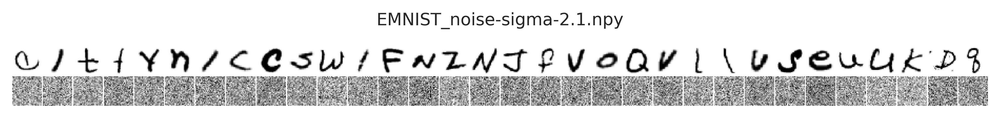

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

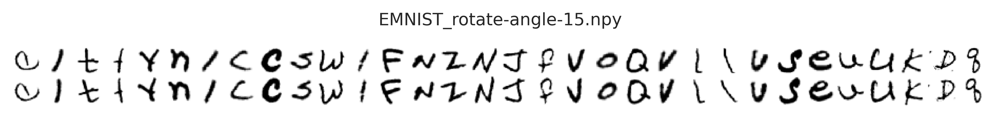

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

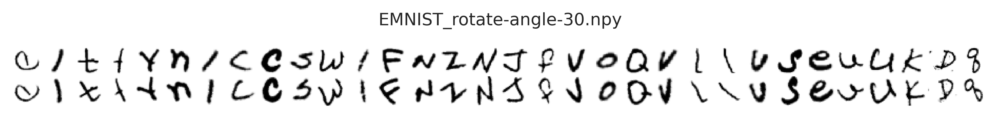

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

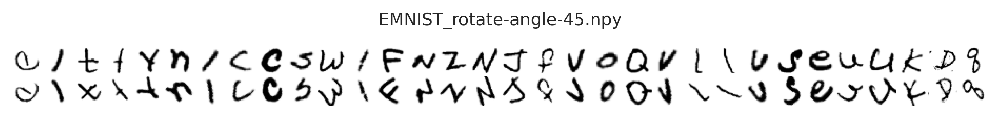

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

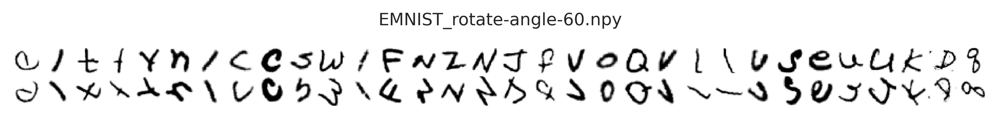

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

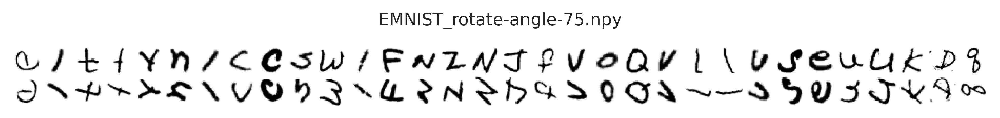

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

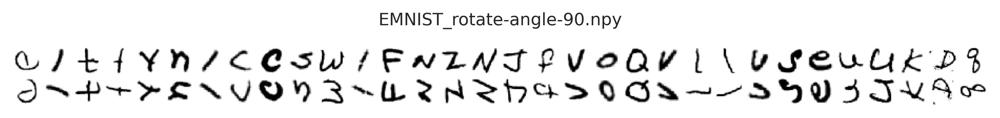

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

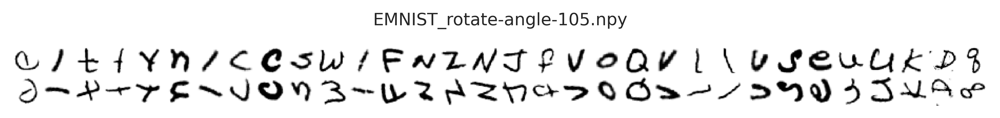

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

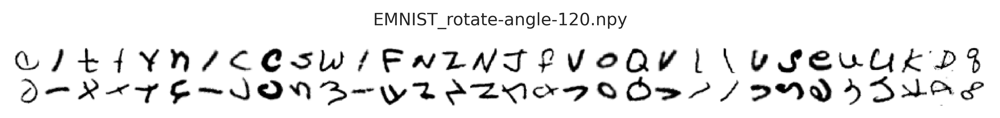

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

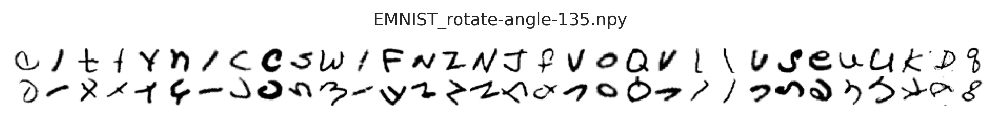

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

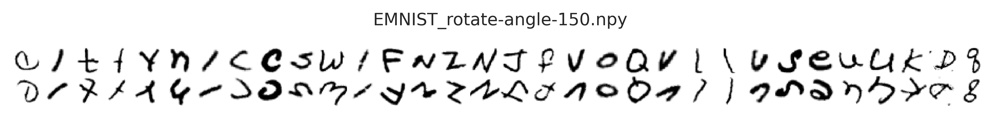

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

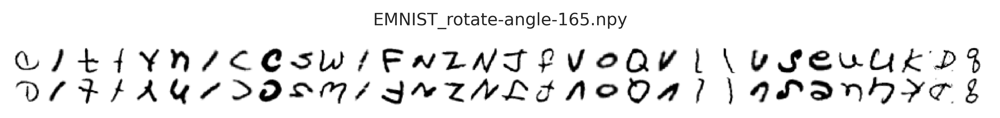

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

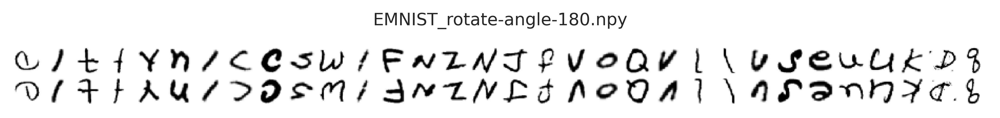

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

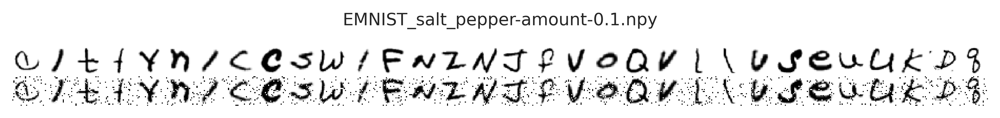

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

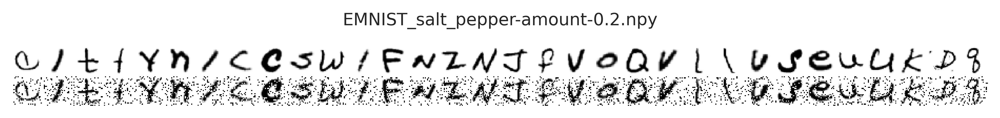

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

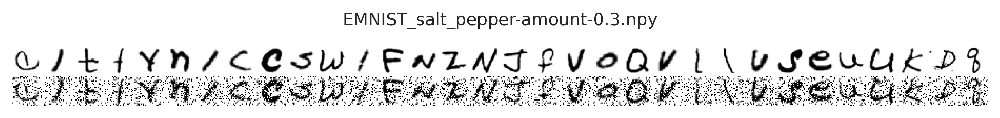

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

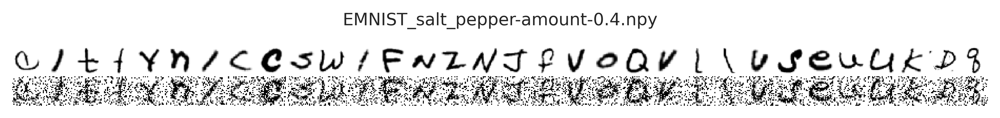

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

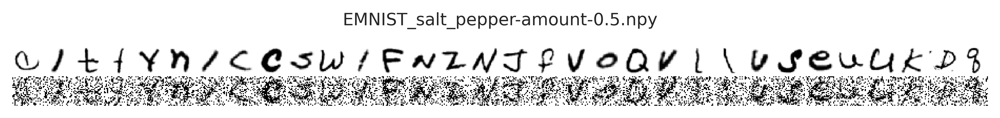

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

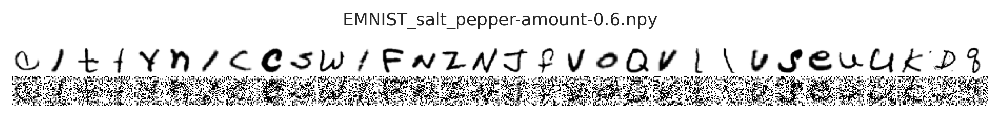

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

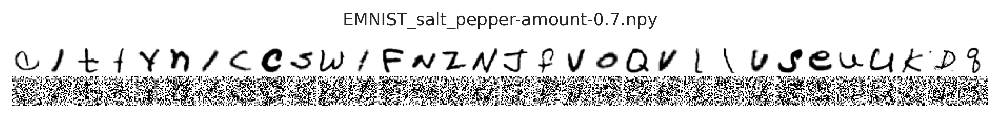

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

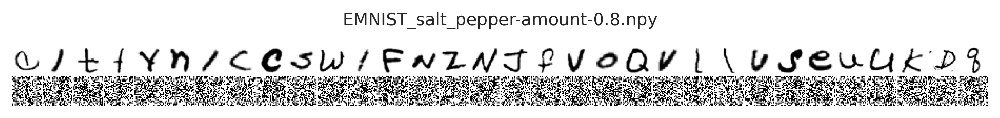

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

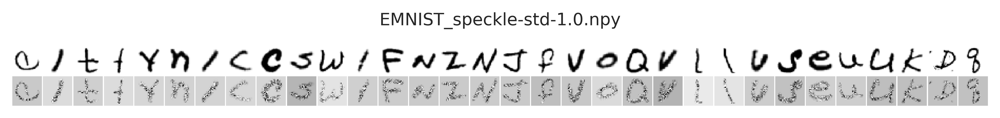

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

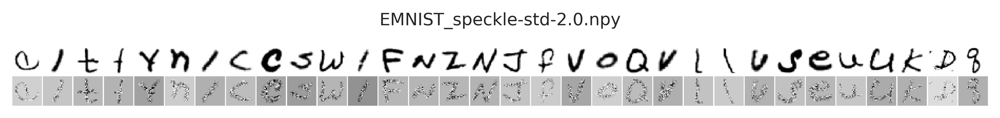

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

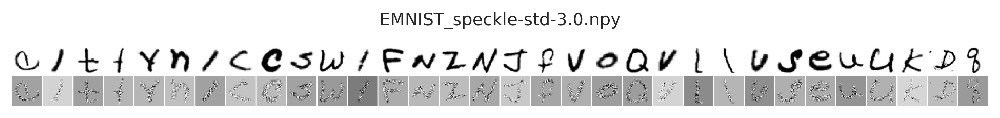

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

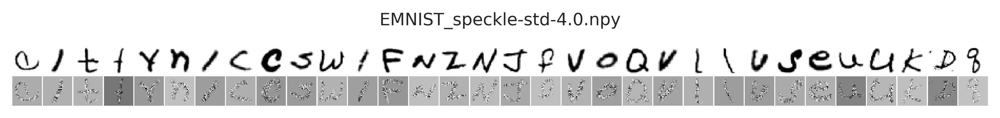

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

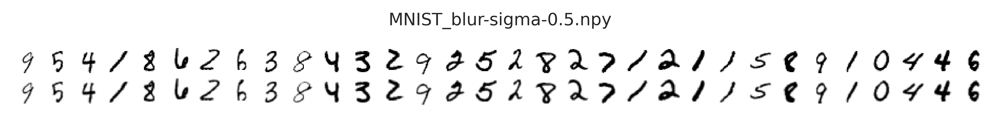

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

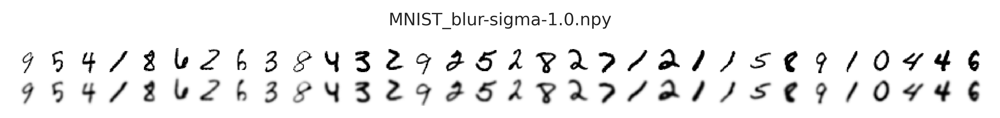

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

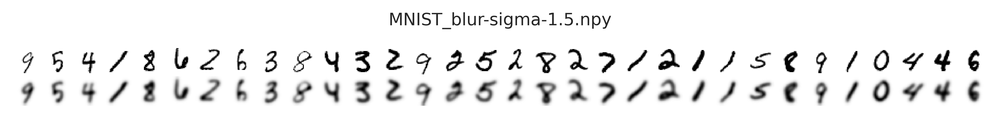

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

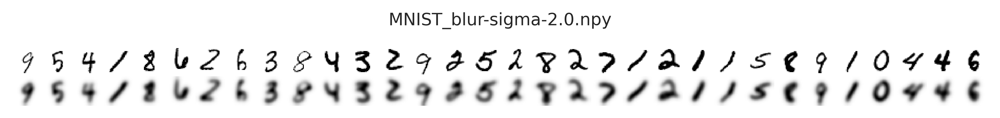

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

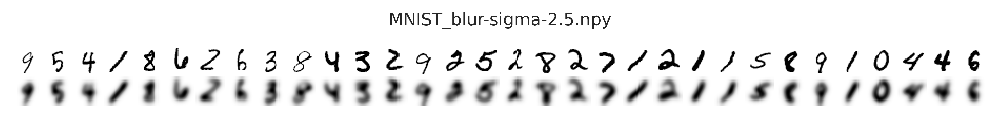

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

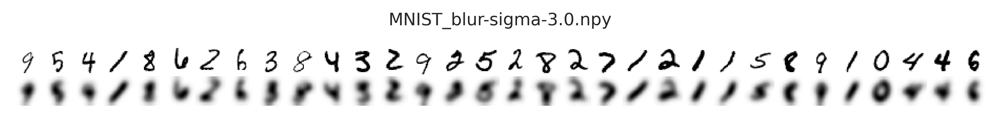

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

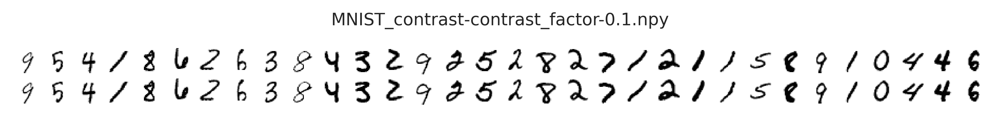

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

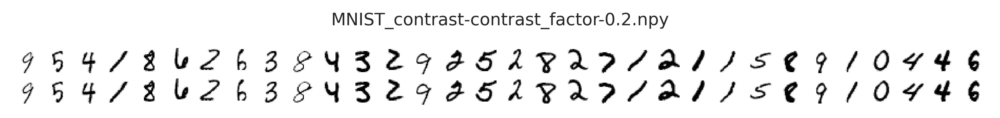

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

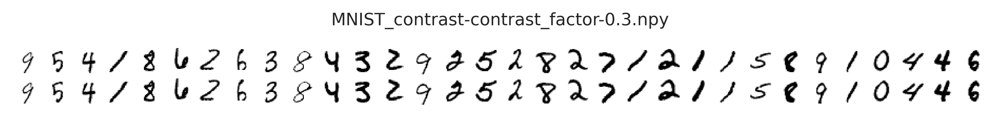

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

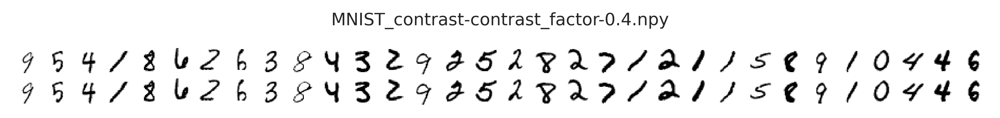

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

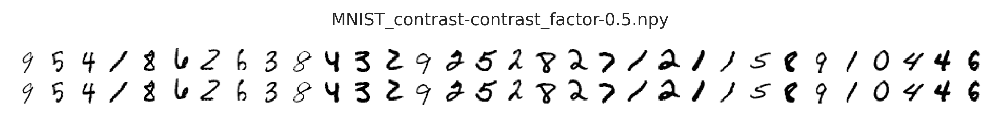

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

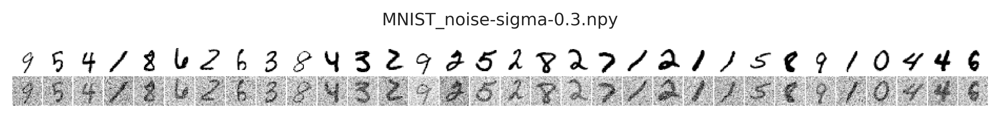

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

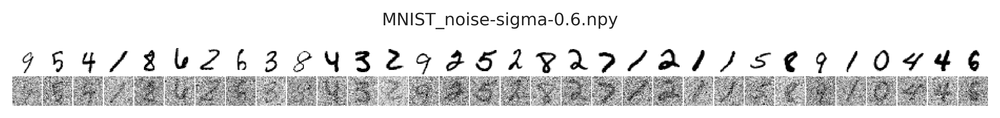

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

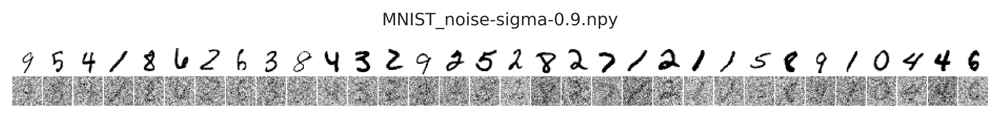

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

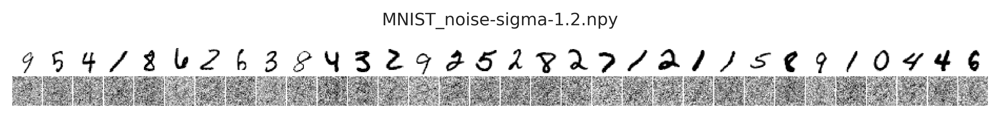

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

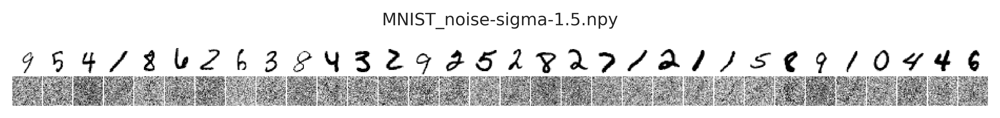

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

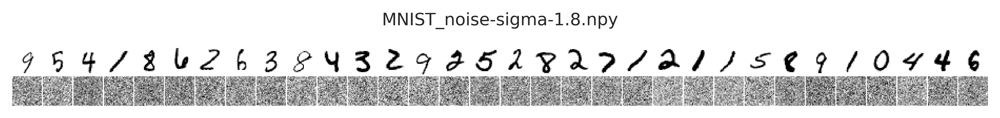

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

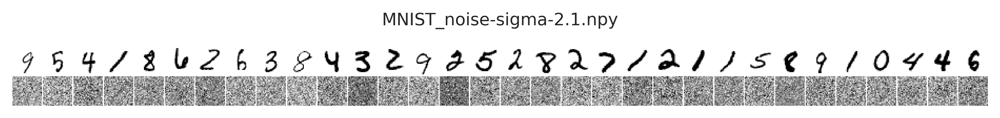

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

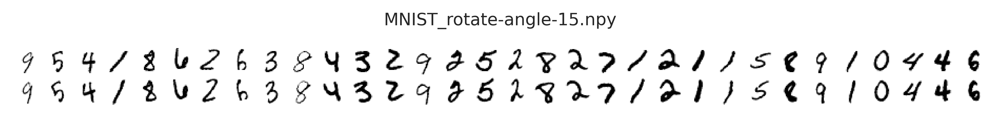

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

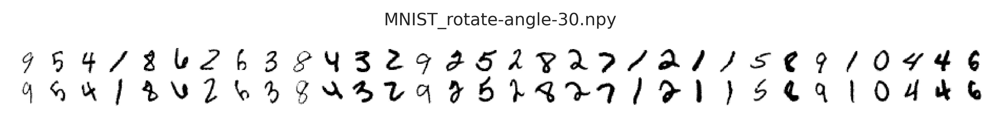

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

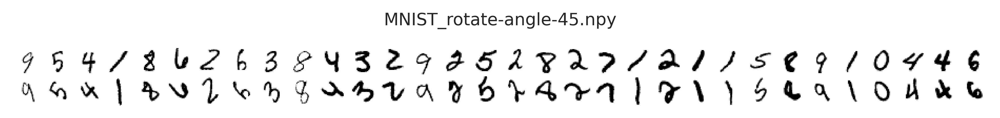

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

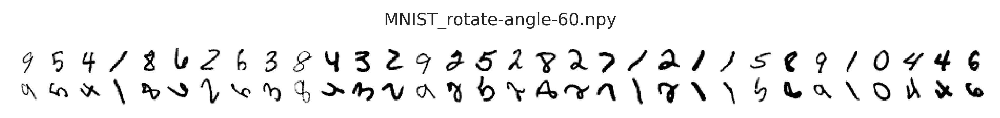

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

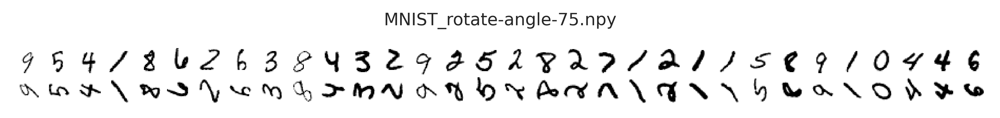

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

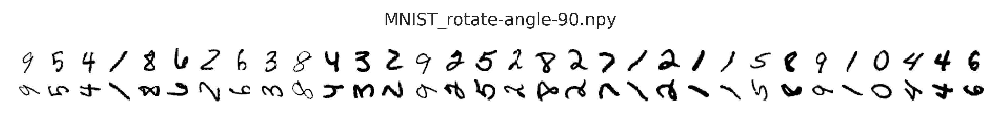

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

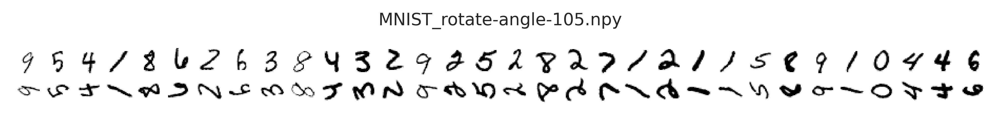

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

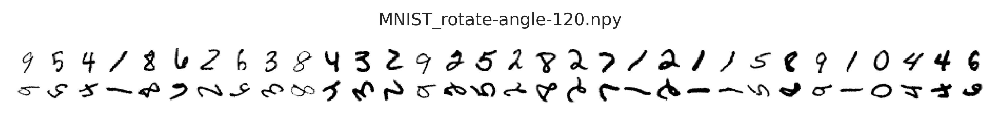

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

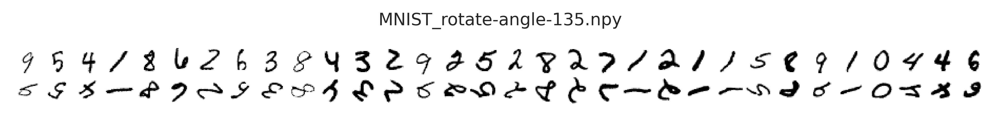

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

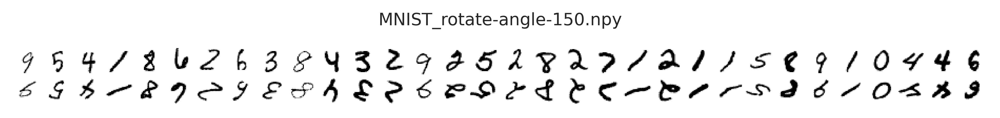

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

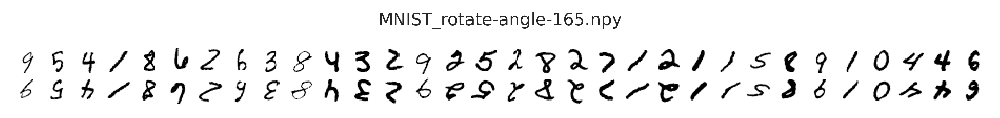

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

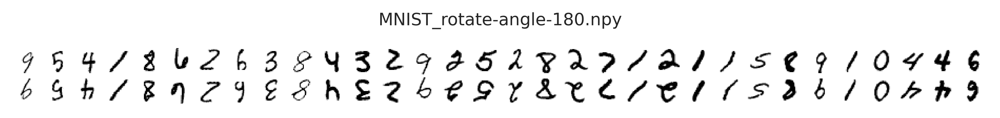

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

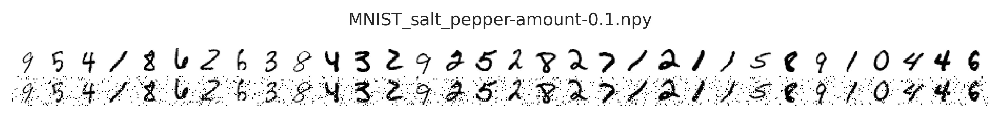

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

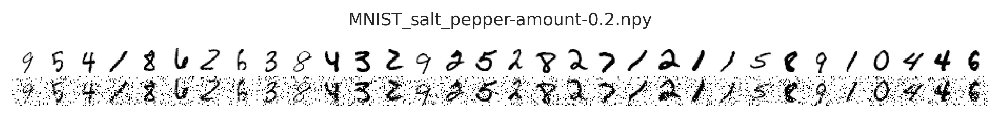

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

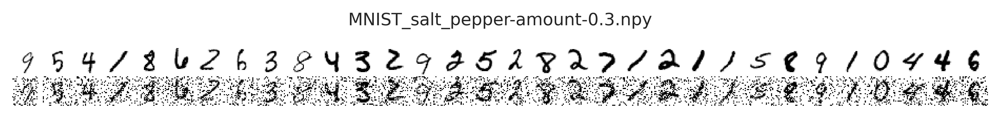

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

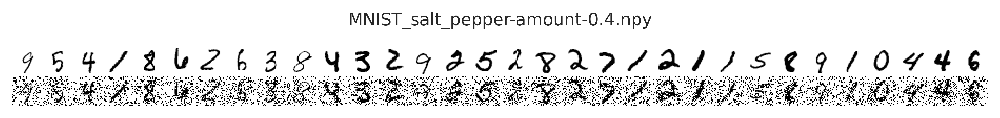

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

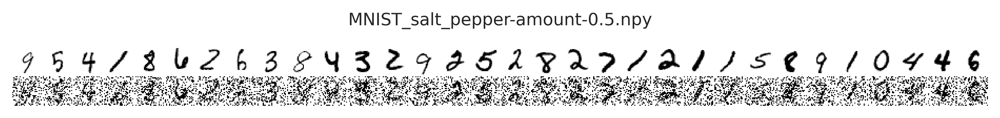

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

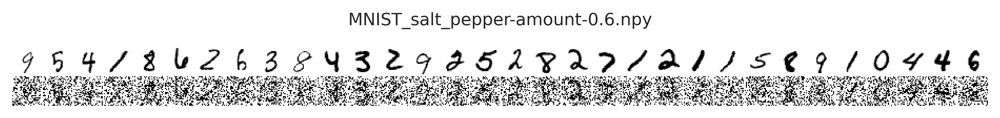

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

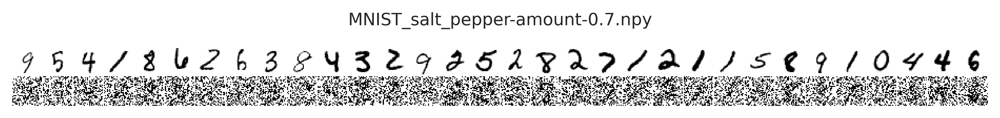

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

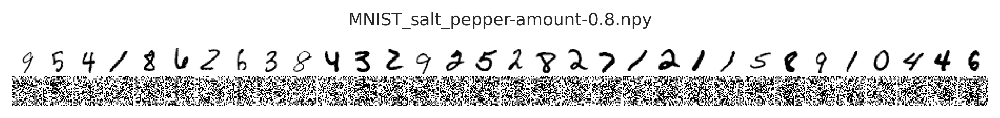

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

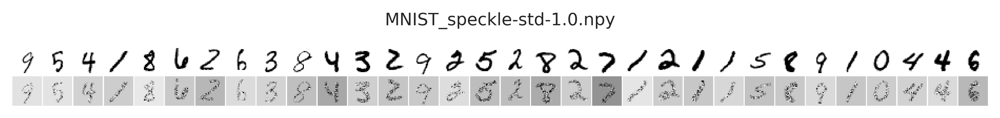

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

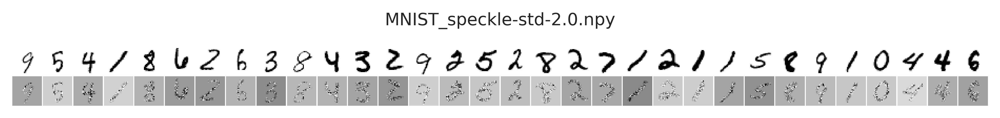

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

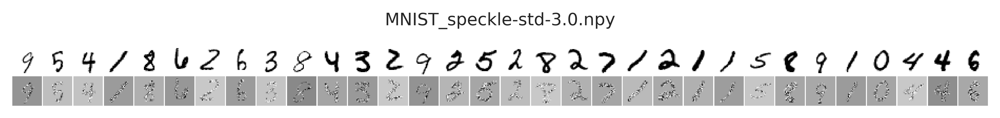

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

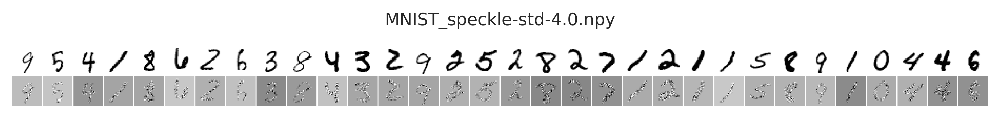

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

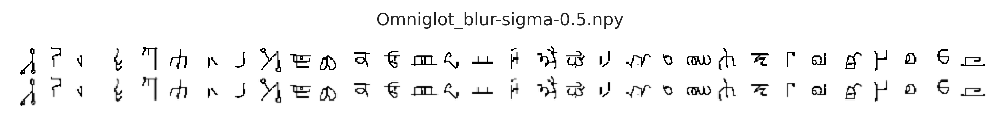

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

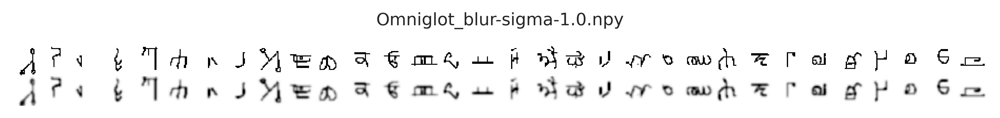

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

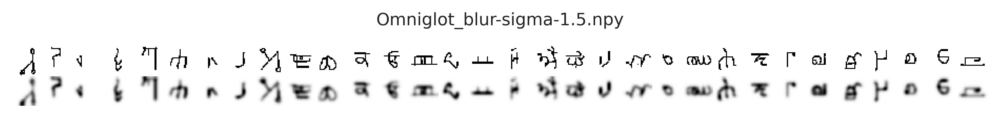

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

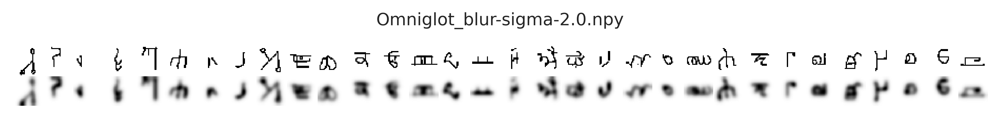

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

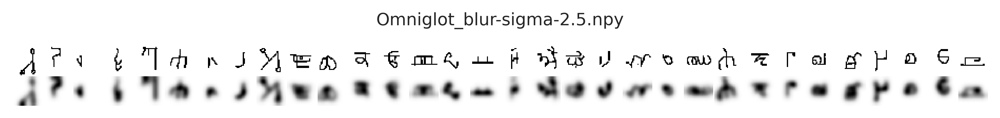

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

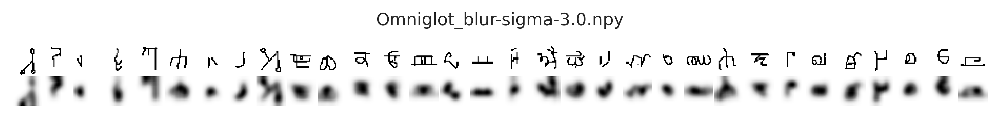

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

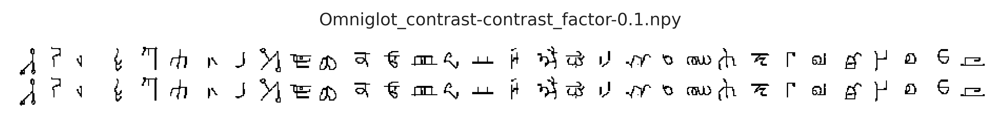

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

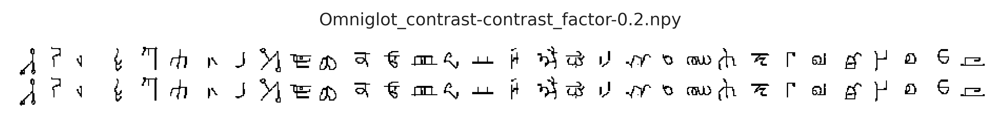

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

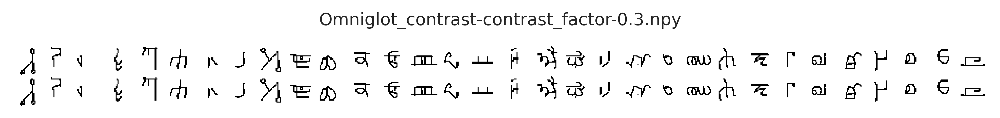

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

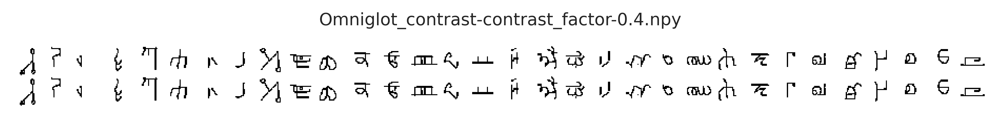

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

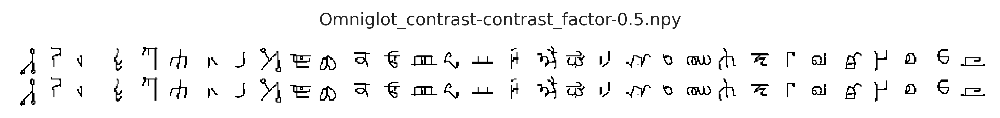

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

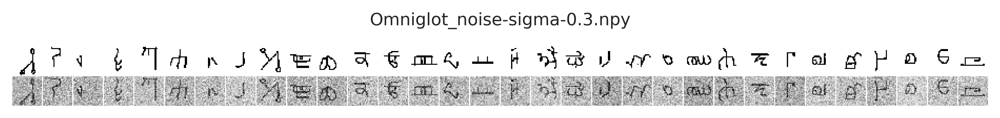

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

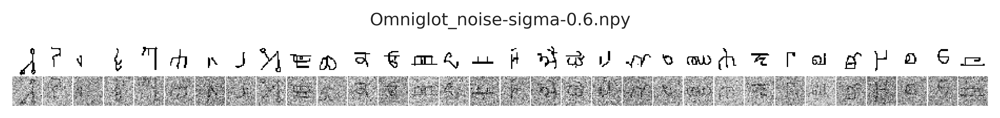

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

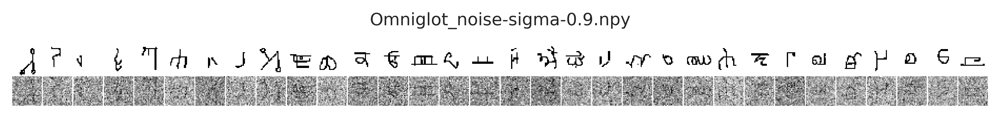

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

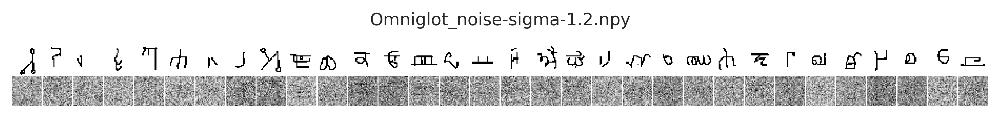

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

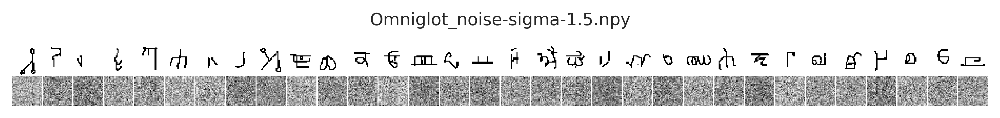

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

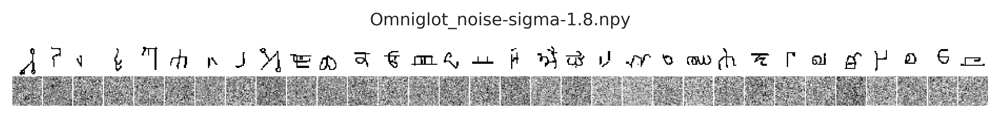

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

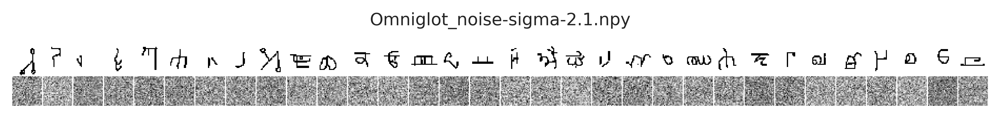

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

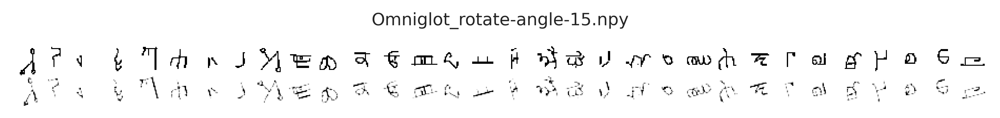

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

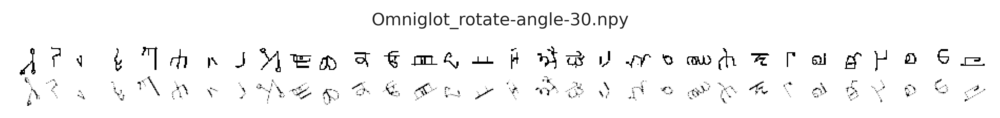

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

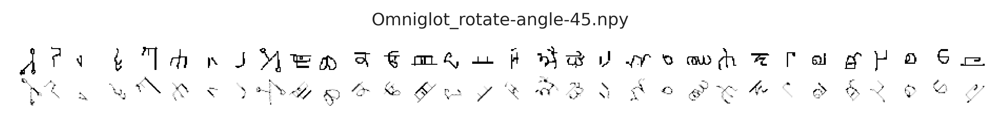

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

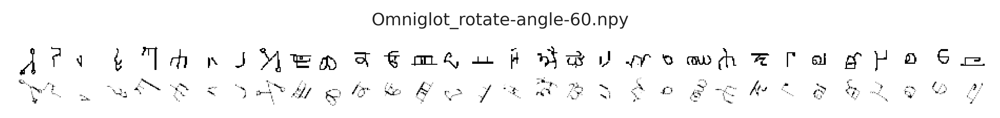

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

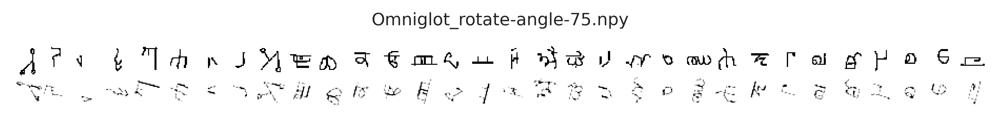

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

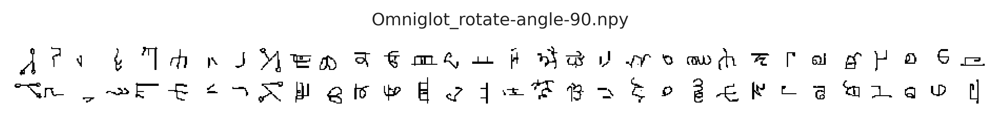

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

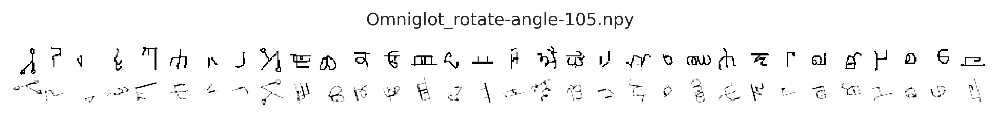

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

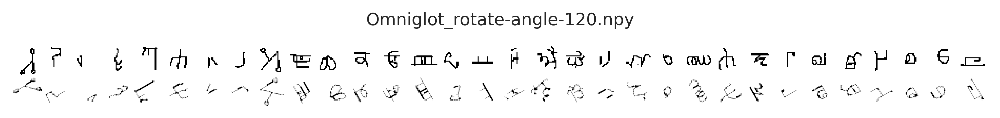

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

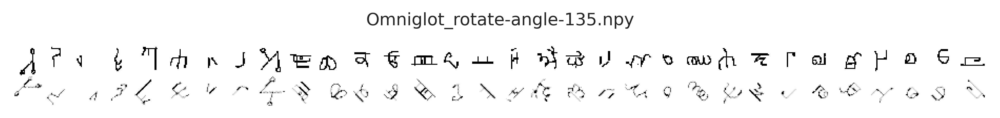

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

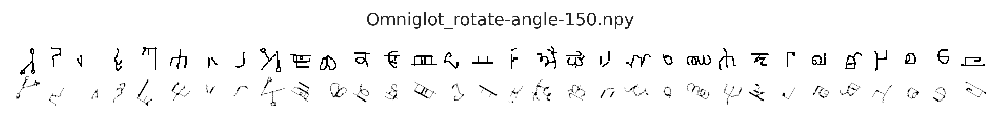

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

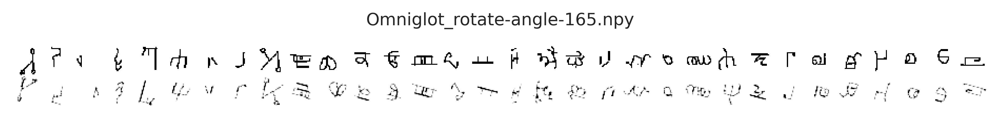

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

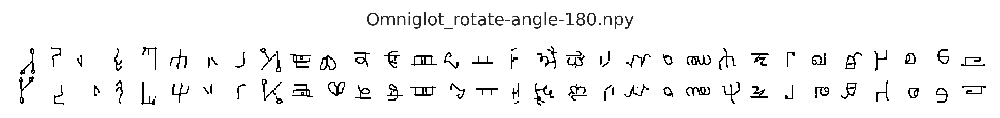

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

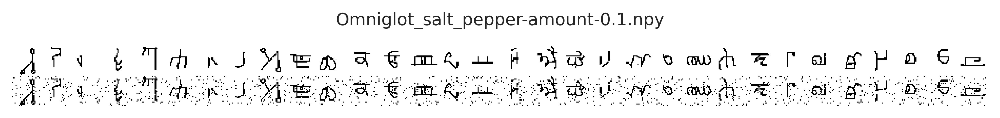

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

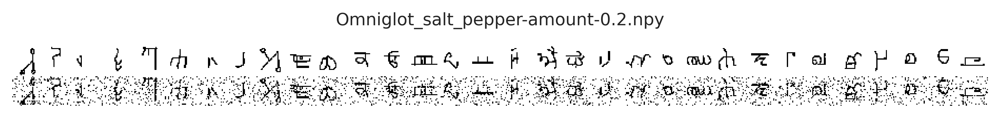

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

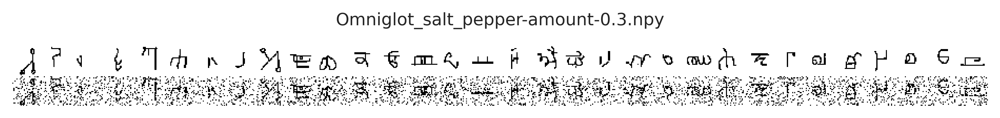

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

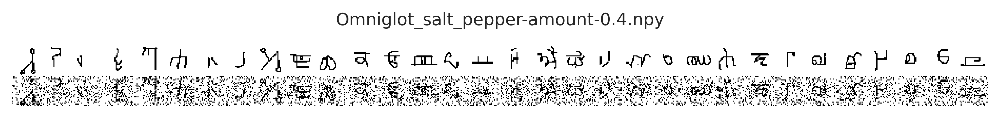

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

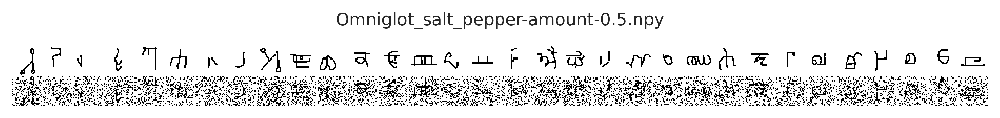

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

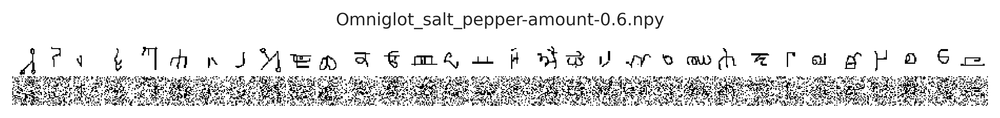

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

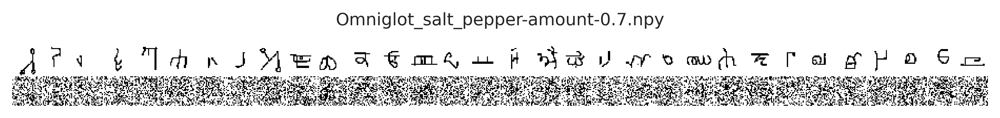

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

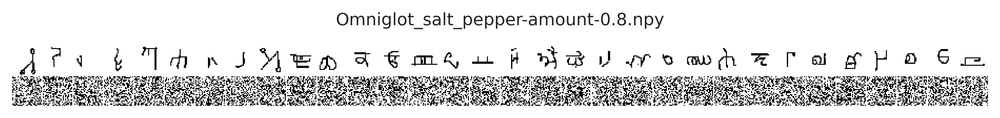

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

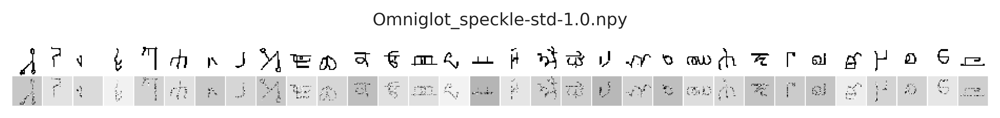

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

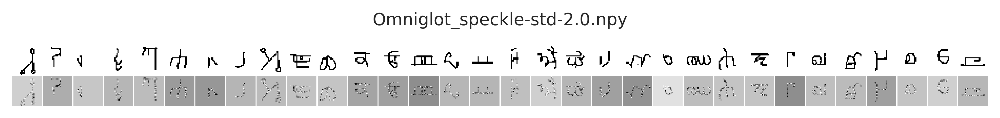

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

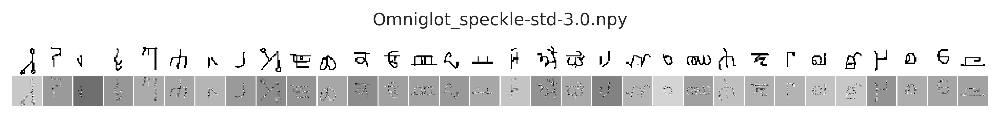

--------------------------------------------------------------------------------------------------------------

______________________________________________________________________________________________________________

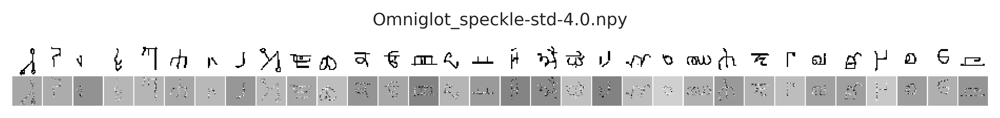

--------------------------------------------------------------------------------------------------------------

In [7]:
inds = {}

for f in files:
    ds = f.split('_')[0]
    trn, vld, _ = make_dataset(ds, 'cpu')
    data = np.load(pjoin(load_dir, f), allow_pickle=True).item()

    if ds not in inds:
        inds[ds] = rng.choice(
            len(vld),
            size=num,
            replace=False,
        )

    x2p = np.concatenate([
        tonp(vld.tensors[0])[inds[ds]],
        data['x_corrupted_vld'][inds[ds]],
    ])
    fig, ax = plot_weights(x2p, nrows=2, cmap='Greys', dpi=500, display=False)
    fig.suptitle(f, fontsize=10, y=0.63)
    
    print('_' * 110)
    display(fig)
    print('-' * 110)

    print('\n\n')